In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

In [2]:
dataset = pd.read_csv("diabetes_prediction_dataset.csv")

In [3]:
dataset.shape

(100000, 9)

In [4]:
X = dataset.iloc[:,8].values
print(X.mean())
print(X.std())

0.085
0.27888169534768686


In [5]:
smoking_histor_dict = {'never':0,'former':1,'current':2}

dataset['smoking_history'] = dataset.smoking_history.map(smoking_histor_dict)

In [6]:
dataset.head()

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,Female,80.0,0,1,0.0,25.19,6.6,140,0
1,Female,54.0,0,0,NaN,27.32,6.6,80,0
2,Male,28.0,0,0,0.0,27.32,5.7,158,0
3,Female,36.0,0,0,2.0,23.45,5.0,155,0
4,Male,76.0,1,1,2.0,20.14,4.8,155,0


In [7]:
gender_dict = {'Female': 0, 'Male': 1}

dataset['gender'] = dataset.gender.map(gender_dict)

In [8]:
dataset.head(50)

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,0.0,80.0,0,1,0.0,25.19,6.6,140,0
1,0.0,54.0,0,0,NaN,27.32,6.6,80,0
2,1.0,28.0,0,0,0.0,27.32,5.7,158,0
3,0.0,36.0,0,0,2.0,23.45,5.0,155,0
4,1.0,76.0,1,1,2.0,20.14,4.8,155,0
5,0.0,20.0,0,0,0.0,27.32,6.6,85,0
6,0.0,44.0,0,0,0.0,19.31,6.5,200,1
7,0.0,79.0,0,0,NaN,23.86,5.7,85,0
8,1.0,42.0,0,0,0.0,33.64,4.8,145,0
9,0.0,32.0,0,0,0.0,27.32,5.0,100,0


In [9]:
dataset.isnull().sum()

gender                    18
age                        0
hypertension               0
heart_disease              0
smoking_history        46267
bmi                        0
HbA1c_level                0
blood_glucose_level        0
diabetes                   0
dtype: int64

In [10]:
from sklearn.impute import SimpleImputer

imputer = SimpleImputer(strategy='mean')

dataset = imputer.fit_transform(dataset)

dataset.shape

(100000, 9)

In [11]:
target = dataset[:,8]

In [12]:
target = pd.DataFrame(target,columns=['diabetes'])

In [13]:
target.head(50)

,diabetes
0,0.0
1,0.0
2,0.0
3,0.0
4,0.0
5,0.0
6,1.0
7,0.0
8,0.0
9,0.0


In [14]:
X = dataset[:,0:8]

In [15]:
X.shape

(100000, 8)

In [16]:
features = pd.DataFrame(X,columns=['gender', 'age', 'hypertension', 'heart_disease', 'smoking_history', 'bmi', 'HbA1c_level', 'blood_glucose_level'])

In [17]:
features.head(50)

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level
0,0.0,80.0,0.0,1.0,0.000000,25.19,6.6,140.0
1,0.0,54.0,0.0,0.0,0.519681,27.32,6.6,80.0
2,1.0,28.0,0.0,0.0,0.000000,27.32,5.7,158.0
3,0.0,36.0,0.0,0.0,2.000000,23.45,5.0,155.0
4,1.0,76.0,1.0,1.0,2.000000,20.14,4.8,155.0
5,0.0,20.0,0.0,0.0,0.000000,27.32,6.6,85.0
6,0.0,44.0,0.0,0.0,0.000000,19.31,6.5,200.0
7,0.0,79.0,0.0,0.0,0.519681,23.86,5.7,85.0
8,1.0,42.0,0.0,0.0,0.000000,33.64,4.8,145.0
9,0.0,32.0,0.0,0.0,0.000000,27.32,5.0,100.0


In [18]:
dataset = pd.DataFrame(dataset,columns=['gender', 'age', 'hypertension', 'heart_disease', 'smoking_history', 'bmi', 'HbA1c_level', 'blood_glucose_level','diabetes'])

In [19]:
dataset

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,0.0,80.0,0.0,1.0,0.000000,25.19,6.6,140.0,0.0
1,0.0,54.0,0.0,0.0,0.519681,27.32,6.6,80.0,0.0
2,1.0,28.0,0.0,0.0,0.000000,27.32,5.7,158.0,0.0
3,0.0,36.0,0.0,0.0,2.000000,23.45,5.0,155.0,0.0
4,1.0,76.0,1.0,1.0,2.000000,20.14,4.8,155.0,0.0
...,...,...,...,...,...,...,...,...,...
99995,0.0,80.0,0.0,0.0,0.519681,27.32,6.2,90.0,0.0
99996,0.0,2.0,0.0,0.0,0.519681,17.37,6.5,100.0,0.0
99997,1.0,66.0,0.0,0.0,1.000000,27.83,5.7,155.0,0.0
99998,0.0,24.0,0.0,0.0,0.000000,35.42,4.0,100.0,0.0


In [20]:
print("The mean and the standard deviations are")
X.mean(), X.std()

The mean and the standard deviations are


(26.73006441632574, 47.54722630410058)

In [21]:
# Standardize the inital data and calculate the mean and standard deviation
def standardize(x):
    x_std = StandardScaler().fit_transform(x)
    return x_std, x_std.mean(), x_std.std()

In [22]:
#Calculate the covariance matrix
def covariance_matrix(x_std):
    return np.cov(x_std.T)

In [23]:
#Calculate the eigen values and vectors
def eigVecVal(sx):
    eigVal, eigVec = np.linalg.eig(sx)
    return eigVal, eigVec

In [24]:
def sort_eigen(eigenvalues, eigenvectors):
    sorted_indices = np.argsort(eigenvalues)[::-1]  # Sort indices in descending order
    sorted_eigenvalues = eigenvalues[sorted_indices] #Sorts the eigenValues
    sorted_eigenvectors = eigenvectors[:, sorted_indices] # Sorts the column according to the indices
    return sorted_eigenvalues, sorted_eigenvectors

In [25]:
# gives the proportion of variance explained by a particular eigen value/ pricipal component in the dataset 
def explained_variance(eigenvalues):
    sum = eigenvalues.sum()
    return (eigenvalues/sum) * 100

In [26]:
# For the start parameter give the index of the first eigenvalue and for the end give the index + 1
def transformed_data(standardized_data, eigVec, start, end):
    transformed_x = np.matmul(eigVec.T[start:end], standardized_data.T).T
    return transformed_x

In [27]:
X_std, X_std_mean, X_std_standard_deviation = standardize(X)

In [28]:
print("The new mean and standard deviation after standardization are:")
X_std_mean, X_std_standard_deviation

The new mean and standard deviation after standardization are:


(-2.7426949600339868e-17, 0.9999999999999998)

In [29]:
# The covariance matrix is
Sx = covariance_matrix(X_std)

In [30]:
# Calculating the eigen values and eigen vectors
eigenValues, eigenVectors = eigVecVal(Sx)

In [31]:
sorted_eigenValues, sorted_eigenVectors = sort_eigen(eigenValues, eigenVectors)

In [32]:
# Gives the proportion of eigen vectors
variance_eigen = explained_variance(sorted_eigenValues) 

In [33]:
variance_eigen

array([21.50662103, 13.80260617, 13.22700246, 11.96988863, 10.99548693,
       10.56151007, 10.41159826,  7.52528645])

In [34]:
members_roll = ["THA076BCT017", "THA076BCT022"]

In [35]:
# Taking the top 2 eigen values
transformed_x = transformed_data(X_std, sorted_eigenVectors, 0, 2)

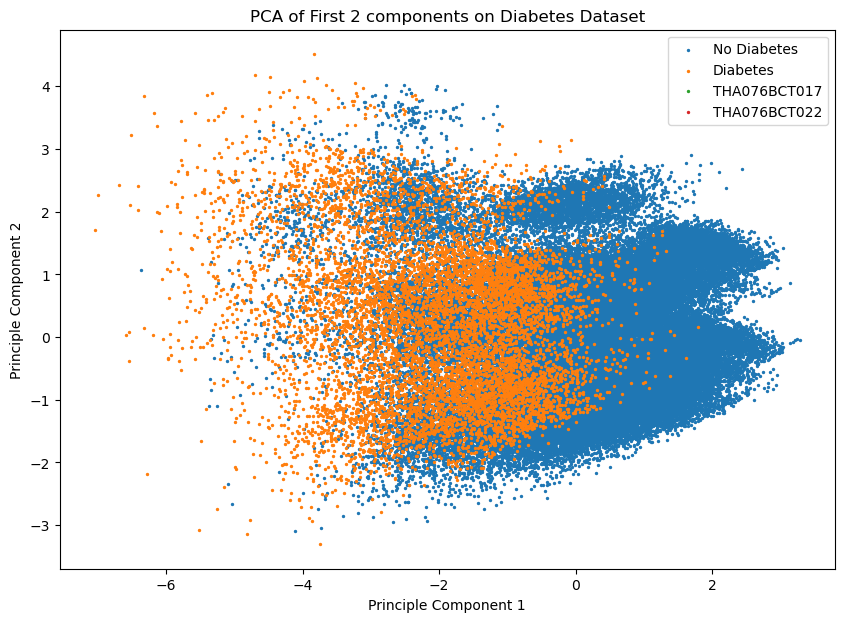

In [38]:
targetNames = ["No Diabetes", "Diabetes"]
targetNames = list(targetNames) + members_roll
plt.figure(figsize=(10, 7))
for i, targetName in zip([0,1,2,3,4], targetNames):
    plt.scatter(transformed_x[dataset['diabetes'] == i][:, 0], transformed_x[dataset['diabetes'] == i][:, 1],label=targetName, s=2)
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend()
plt.title('PCA of First 2 components on Diabetes Dataset')
plt.show()

In [55]:
transformed_low = transformed_data(X_std, sorted_eigenVectors, 6, 8)

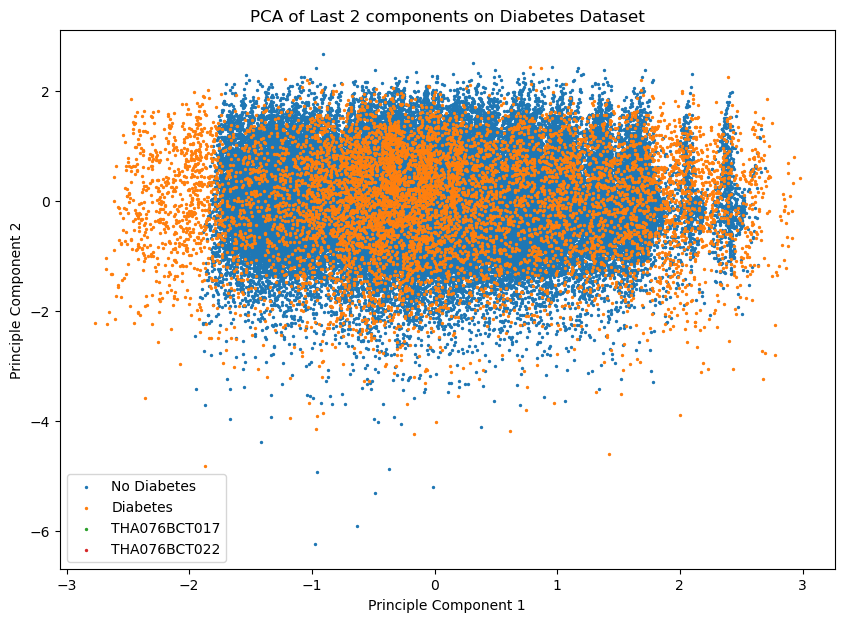

In [57]:
targetNames = ["No Diabetes", "Diabetes"]
targetNames = list(targetNames) + members_roll
plt.figure(figsize=(10, 7))
for i, targetName in zip([0,1,2,3,4], targetNames):
    plt.scatter(transformed_low[dataset['diabetes'] == i][:, 0], transformed_low[dataset['diabetes'] == i][:, 1],label=targetName, s=2)
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend()
plt.title('PCA of Last 2 components on Diabetes Dataset')
plt.show()

In [39]:
# Taking two eigen vectors with highest eigen values and variance
transformed_x1 = transformed_data(X_std, sorted_eigenVectors, 0, 3)

In [40]:
import plotly.graph_objects as go
import plotly.offline as pyo

In [ ]:
trace1 = go.Scatter3d(
    x = transformed_x1[dataset['diabetes'] == 0][:, 0],
    y = transformed_x1[dataset['diabetes'] == 0][:, 1],
    z= transformed_x1[dataset['diabetes'] == 0][:, 2],
    mode = "markers",
    marker = dict(
        size=2,
        symbol="circle",
        color="light green"
    ),
    name="No Diabetes"

)


trace2 =go.Scatter3d(
    x = transformed_x1[dataset['diabetes'] == 1][:, 0],
    y = transformed_x1[dataset['diabetes'] == 1][:, 1],
    z= transformed_x1[dataset['diabetes'] == 1][:, 2],
    mode = "markers",
    marker = dict(
        size=2,
        symbol="circle",
        color ="orange"
    ),
    name ="Diabetes"
)


trace3 = go.Scatter3d(
    x=[None],
    y=[None],
    z=[None],
    mode="markers",
    marker=dict(
        size=2,
        symbol="circle",
        color="red"
    ),
    name="THA076BCT017"
)

trace4 = go.Scatter3d(
    x=[None],
    y=[None],
    z=[None],
    mode="markers",
    marker=dict(
        size=2,
        symbol="circle",
        color="purple"
    ),
    name="THA076BCT022"
)


fig = go.Figure(data=[trace1, trace2, trace3, trace4])

fig.update_layout(
    title = "PCA of First 3 components on Diabetes Dataset",
    scene=dict(
    xaxis_title='PC 1',
    yaxis_title='PC 2',
    zaxis_title='PC 3'
))

fig.update_layout(legend=dict(yanchor="top", y=0.85, xanchor="left", x=0.7))
fig.update_layout(title_y=0.85, title_x=0.5)

In [42]:
pyo.init_notebook_mode(connected=False)
pyo.plot(fig, auto_open=True)

'temp-plot.html'

In [43]:
sorted_eigenValues

array([1.72054689, 1.10421954, 1.05817078, 0.95760067, 0.87964775,
       0.84492926, 0.83293619, 0.60202894])

In [44]:
transformed_x2 = transformed_data(X_std, sorted_eigenVectors, 5, 8)

In [ ]:
trace1 = go.Scatter3d(
    x = transformed_x2[dataset['diabetes'] == 0][:, 0],
    y = transformed_x2[dataset['diabetes'] == 0][:, 1],
    z= transformed_x2[dataset['diabetes'] == 0][:, 2],
    mode = "markers",
    marker = dict(
        size=2,
        symbol="circle",
        color="light green"
    ),
    name="No Diabetes"

)

trace2 =go.Scatter3d(
    x = transformed_x2[dataset['diabetes'] == 1][:, 0],
    y = transformed_x2[dataset['diabetes'] == 1][:, 1],
    z= transformed_x2[dataset['diabetes'] == 1][:, 2],
    mode = "markers",
    marker = dict(
        size=2,
        symbol="circle",
        color ="orange"
    ),
    name ="Diabetes"
)


trace3 = go.Scatter3d(
    x=[None],
    y=[None],
    z=[None],
    mode="markers",
    marker=dict(
        size=2,
        symbol="circle",
        color="red"
    ),
    name="THA076BCT017"
)

trace4 = go.Scatter3d(
    x=[None],
    y=[None],
    z=[None],
    mode="markers",
    marker=dict(
        size=2,
        symbol="circle",
        color="purple"
    ),
    name="THA076BCT022"
)


fig2 = go.Figure(data=[trace1, trace2, trace3, trace4])

fig2.update_layout(
    title = "PCA of last 3 components on Diabetes Dataset",
    scene=dict(
    xaxis_title='PC 6',
    yaxis_title='PC 7',
    zaxis_title='PC 8'
))

fig2.update_layout(legend=dict(yanchor="top", y=0.85, xanchor="left", x=0.7))
fig2.update_layout(title_y=0.85, title_x=0.5)

In [47]:
pyo.init_notebook_mode(connected=False)
pyo.plot(fig2, auto_open=True)

'temp-plot.html'

In [48]:
from sklearn.decomposition import PCA

In [49]:
pca_from_lib_2d = PCA(n_components=2, random_state=20)
pca_from_lib_2d.fit(X_std)
new_x2d = pca_from_lib_2d.transform(X_std)

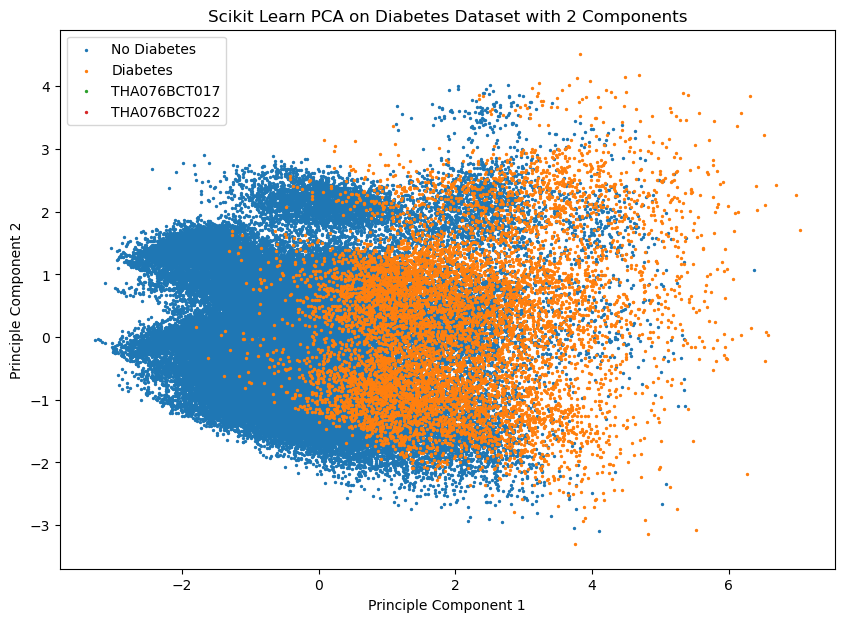

In [51]:
targetNames = ["No Diabetes", "Diabetes"]
targetNames = list(targetNames) + members_roll
plt.figure(figsize=(10, 7))
for i, targetName in zip([0,1,2,3,4], targetNames):
    plt.scatter(new_x2d[dataset['diabetes'] == i][:, 0], new_x2d[dataset['diabetes'] == i][:, 1],label=targetName, s=2)
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend()
plt.title('Scikit Learn PCA on Diabetes Dataset with 2 Components')
plt.show()

In [52]:
pca_from_lib3d = PCA(n_components=3, random_state=20)
pca_from_lib3d.fit(X_std)
new_x3d = pca_from_lib3d.transform(X_std)

In [ ]:
trace1_3 = go.Scatter3d(
    x = new_x3d[dataset['diabetes'] == 0][:, 0],
    y = new_x3d[dataset['diabetes'] == 0][:, 1],
    z= new_x3d[dataset['diabetes'] == 0][:, 2],
    mode = "markers",
    marker = dict(
        size=2,
        symbol="circle",
        color="light green"
    ),
    name="No Diabetes"

)


trace2_3 =go.Scatter3d(
    x = new_x3d[dataset['diabetes'] == 1][:, 0],
    y = new_x3d[dataset['diabetes'] == 1][:, 1],
    z= new_x3d[dataset['diabetes'] == 1][:, 2],
    mode = "markers",
    marker = dict(
        size=2,
        symbol="circle",
        color ="orange"
    ),
    name ="Diabetes"
)


trace3_3 = go.Scatter3d(
    x=[None],
    y=[None],
    z=[None],
    mode="markers",
    marker=dict(
        size=2,
        symbol="circle",
        color="red"
    ),
    name="THA076BCT017"
)

trace4_3 = go.Scatter3d(
    x=[None],
    y=[None],
    z=[None],
    mode="markers",
    marker=dict(
        size=2,
        symbol="circle",
        color="purple"
    ),
    name="THA076BCT022"
)


fig3 = go.Figure(data=[trace1_3, trace2_3, trace3_3, trace4_3])

fig3.update_layout(
    title = "Scikit Learn PCA on Diabetes Dataset with 3 Components",
    scene=dict(
    xaxis_title='PC 1',
    yaxis_title='PC 2',
    zaxis_title='PC 3'
))

fig3.update_layout(legend=dict(yanchor="top", y=0.85, xanchor="left", x=0.7))
fig3.update_layout(title_y=0.85, title_x=0.5)

In [54]:
pyo.init_notebook_mode(connected=False)
pyo.plot(fig3, auto_open=True)

'temp-plot.html'

<font size="8">BEFORE CODE AFTER THIS IS NOT CORRECT FORM

In [22]:
scaler = StandardScaler()

X_std = scaler.fit_transform(X)

In [23]:
X_std.shape

(100000, 8)

In [24]:
X_std.mean()

-2.7426949600339868e-17

In [25]:
X_std.std()

0.9999999999999998

In [26]:
Sx = np.cov(X_std.T)

In [27]:
Sx.shape

(8, 8)

In [28]:
eigen_values,eigen_vectors = np.linalg.eig(Sx)

In [29]:
eigen_values

array([1.72054689, 0.60202894, 1.10421954, 1.05817078, 0.95760067,
       0.87964775, 0.84492926, 0.83293619])

In [30]:
eigen_vectors

array([[-3.38795750e-02,  1.04709181e-01,  7.24600981e-01,
         4.82318672e-02,  2.50768526e-01,  6.12355564e-01,
        -1.50299066e-01,  7.82740345e-03],
       [-5.62824770e-01,  7.60789796e-01, -1.56211375e-01,
         2.36674881e-01, -6.44489519e-03, -2.90936867e-02,
        -1.50634115e-01, -2.07739029e-02],
       [-4.17652254e-01, -1.93019594e-01, -7.64278667e-02,
         1.37131015e-01,  1.97409790e-01,  2.09756410e-01,
         8.22534565e-01,  6.42838262e-02],
       [-3.55701722e-01, -3.25748617e-01,  2.95908817e-01,
         1.90579282e-01,  4.95152248e-01, -5.87887151e-01,
        -2.28936729e-01, -1.68093997e-02],
       [-9.89055114e-02, -3.13405510e-02,  5.09576553e-01,
         2.69710440e-01, -7.37553550e-01, -2.74829886e-01,
         1.92806563e-01, -1.15069119e-02],
       [-4.52305423e-01, -5.15625102e-01, -2.71809106e-01,
         1.66185273e-01, -3.01006188e-01,  3.90669240e-01,
        -4.27329748e-01, -4.70630469e-02],
       [-2.82085120e-01,  3.830111

In [31]:
proportion = eigen_values/eigen_values.sum()

In [32]:
proportion

array([0.21506621, 0.07525286, 0.13802606, 0.13227002, 0.11969889,
       0.10995487, 0.1056151 , 0.10411598])

In [33]:
percentage_proportion=[]

In [34]:
for i in proportion:
    percentage_proportion.append(int(i*100))

In [35]:
percentage_proportion

[21, 7, 13, 13, 11, 10, 10, 10]

In [36]:
sum(percentage_proportion)

95

In [37]:
top_three_values = []
top_three_values.append(eigen_values[0])

In [38]:
top_three_values.append(eigen_values[2])
top_three_values.append(eigen_values[3])


In [39]:
top_three_values

[1.720546887676367, 1.1042195358340177, 1.0581707785607943]

In [40]:
top_three_vectors = eigen_vectors[:,[0,2,3]]

In [41]:
top_three_vectors.shape

(8, 3)

In [42]:
transformed_x = np.matmul(top_three_vectors.T,X_std.T).T
transformed_x

array([[-2.62182877,  0.34631913,  0.29071736],
       [ 0.05516565, -0.76519204,  0.24444365],
       [ 0.39850274,  0.5203233 , -0.81797463],
       ...,
       [-0.73922068,  1.12922823,  0.1163787 ],
       [ 0.88383933, -1.5824476 ,  1.13535177],
       [-0.0179808 ,  0.77345392,  0.7086264 ]])

In [43]:
transformed_x.shape

(100000, 3)

In [44]:
import matplotlib.pyplot as plt

In [ ]:
fig = plt.figure()
fig = plt.figure(figsize=(50, 40))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(transformed_x[dataset['diabetes'] == 0][:, 0], transformed_x[dataset['diabetes'] == 0][:, 1],transformed_x[dataset['diabetes'] == 0][:, 2])
ax.scatter(transformed_x[dataset['diabetes'] == 1][:, 0], transformed_x[dataset['diabetes'] == 1][:, 1],transformed_x[dataset['diabetes'] == 1][:, 2])
plt.show()

In [45]:
!pip install plotly

In [46]:
import plotly.graph_objects as go
import plotly.offline as pyo

In [ ]:

trace1 = go.Scatter3d(
    x = transformed_x[dataset['diabetes'] == 0][:, 0],
    y = transformed_x[dataset['diabetes'] == 0][:, 1],
    z= transformed_x[dataset['diabetes'] == 0][:, 2],
    mode = "markers",
    marker = dict(
        size=3,
        symbol="circle",
        color="light green"
    ),
    name="No Diabetes"

)


trace2 =go.Scatter3d(
    x = transformed_x[dataset['diabetes'] == 1][:, 0],
    y = transformed_x[dataset['diabetes'] == 1][:, 1],
    z= transformed_x[dataset['diabetes'] == 1][:, 2],
    mode = "markers",
    marker = dict(
        size=3,
        symbol="circle",
        color ="orange"
    ),
    name ="Diabetes"
)


trace3 = go.Scatter3d(
    x=[None],
    y=[None],
    z=[None],
    mode="markers",
    marker=dict(
        size=5,
        symbol="circle",
        color="red"
    ),
    name="THA076BCT017"
)

trace4 = go.Scatter3d(
    x=[None],
    y=[None],
    z=[None],
    mode="markers",
    marker=dict(
        size=5,
        symbol="circle",
        color="purple"
    ),
    name="THA076BCT022"
)



fig = go.Figure(data=[trace1, trace2, trace3, trace4])

fig.update_layout(scene=dict(
    xaxis_title='PCA 1',
    yaxis_title='PCA 2',
    zaxis_title='PCA 3'
))

In [48]:
# fig.show()

In [49]:
pyo.init_notebook_mode(connected=False)
pyo.plot(fig, auto_open=True)

'temp-plot.html'

In [50]:
from sklearn.decomposition import PCA


In [51]:
pca_3 = PCA(n_components=3, random_state=20)
pca_3.fit(X_std)
X_pca_3 = pca_3.transform(X_std)

In [52]:
X_pca_3

array([[ 2.62182877,  0.34631913, -0.29071736],
       [-0.05516565, -0.76519204, -0.24444365],
       [-0.39850274,  0.5203233 ,  0.81797463],
       ...,
       [ 0.73922068,  1.12922823, -0.1163787 ],
       [-0.88383933, -1.5824476 , -1.13535177],
       [ 0.0179808 ,  0.77345392, -0.7086264 ]])

In [53]:
X_pca_3.shape

(100000, 3)

In [ ]:
trace1 = go.Scatter3d(
    x = X_pca_3[dataset['diabetes'] == 0][:, 0],
    y = X_pca_3[dataset['diabetes'] == 0][:, 1],
    z= X_pca_3[dataset['diabetes'] == 0][:, 2],
    mode = "markers",
    marker = dict(
        size=3,
        symbol="circle",
        color="light green"
    ),
    name="No Diabetes"

)


trace2 =go.Scatter3d(
    x = X_pca_3[dataset['diabetes'] == 1][:, 0],
    y = X_pca_3[dataset['diabetes'] == 1][:, 1],
    z= X_pca_3[dataset['diabetes'] == 1][:, 2],
    mode = "markers",
    marker = dict(
        size=3,
        symbol="circle",
        color ="orange"
    ),
    name ="Diabetes"
)

trace3 = go.Scatter3d(
    x=[None],
    y=[None],
    z=[None],
    mode="markers",
    marker=dict(
        size=5,
        symbol="circle",
        color="red"
    ),
    name="THA076BCT017"
)

trace4 = go.Scatter3d(
    x=[None],
    y=[None],
    z=[None],
    mode="markers",
    marker=dict(
        size=5,
        symbol="circle",
        color="purple"
    ),
    name="THA076BCT022"
)

fig1 = go.Figure(data=[trace1, trace2, trace3, trace4])

fig1.update_layout(scene=dict(
    xaxis_title='PCA 1',
    yaxis_title='PCA 2',
    zaxis_title='PCA 3'
))

In [56]:
pyo.init_notebook_mode(connected=False)
pyo.plot(fig1, auto_open=True)

'temp-plot.html'